In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.utils import to_categorical


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
base_path = '/content/drive/MyDrive/Diabetic_Train_Dataset'
image_folder = os.path.join(base_path, 'colored_images')
csv_file = os.path.join(base_path, 'train.csv')

In [4]:
# Load CSV file
data = pd.read_csv(csv_file)

# Create a dictionary to map folder names to diagnosis
folder_map = {
    'Mild': 0,
    'Moderate': 1,
    'No_DR': 2,
    'Proliferate_DR': 3,
    'Severe': 4
}

In [5]:
# Function to load images
def load_images(image_folder, folder_map, target_size=(224, 224)):
    images = []
    labels = []
    for folder_name, label in folder_map.items():
        folder_path = os.path.join(image_folder, folder_name)
        for file_name in os.listdir(folder_path):
            if file_name.endswith('.png'):
                file_path = os.path.join(folder_path, file_name)
                image = load_img(file_path, target_size=target_size)
                image = img_to_array(image)
                images.append(image)
                labels.append(label)
    return np.array(images), np.array(labels)

# Load images and labels
images, labels = load_images(image_folder, folder_map)
print(f"Loaded {len(images)} images")

Loaded 3662 images


In [6]:
# Ensure Images Are Loaded
if len(images) == 0 or len(labels) == 0:
    raise ValueError("No images found. Please check the file paths and ensure images exist.")

In [7]:
# Normalize images
images = images / 255.0

In [8]:
# One-hot encode labels
labels = to_categorical(labels, num_classes=5)

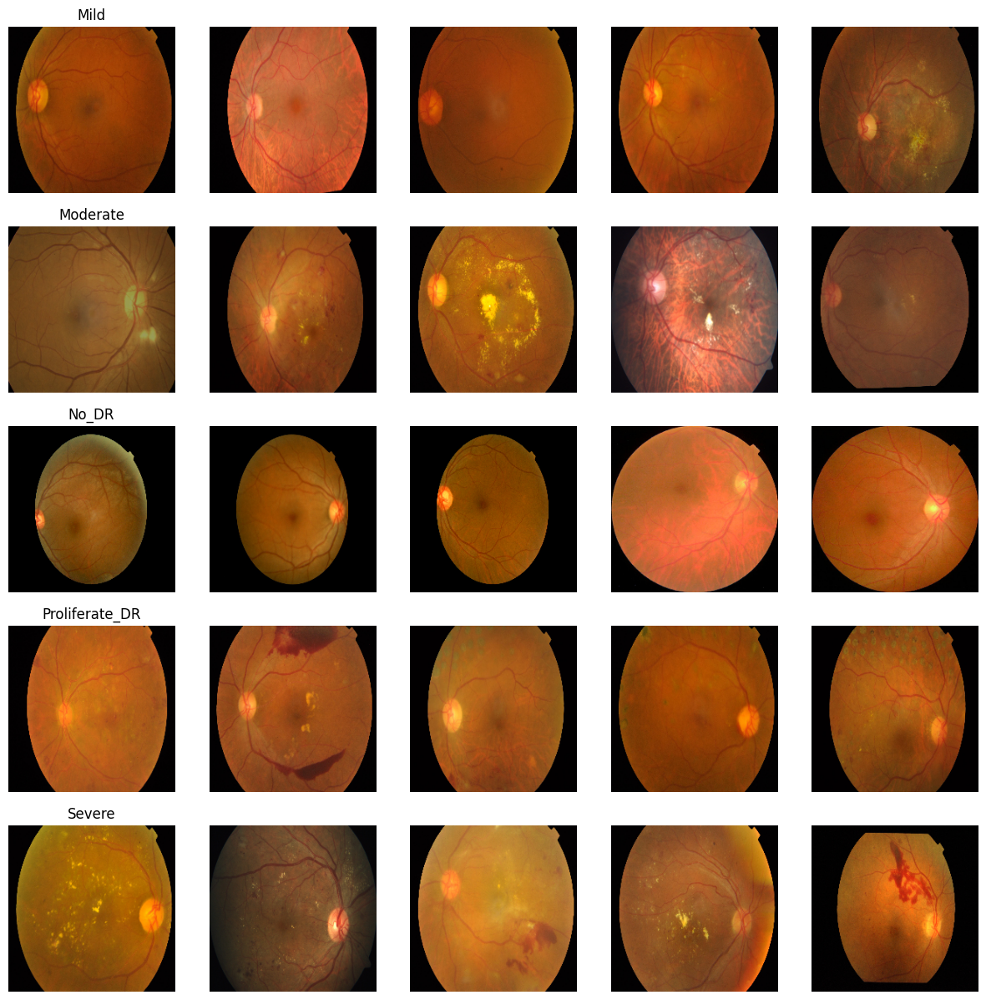

In [9]:
# Visualize a few sample images from each class
def visualize_samples(image_folder, folder_map, num_samples=5):
    fig, axes = plt.subplots(len(folder_map), num_samples, figsize=(15, 15))
    for i, (folder_name, label) in enumerate(folder_map.items()):
        folder_path = os.path.join(image_folder, folder_name)
        sample_images = os.listdir(folder_path)[:num_samples]
        for j, img_name in enumerate(sample_images):
            img_path = os.path.join(folder_path, img_name)
            img = load_img(img_path, target_size=(224, 224))
            axes[i, j].imshow(img)
            axes[i, j].axis('off')
            if j == 0:
                axes[i, j].set_title(folder_name)
    plt.show()

visualize_samples(image_folder, folder_map)

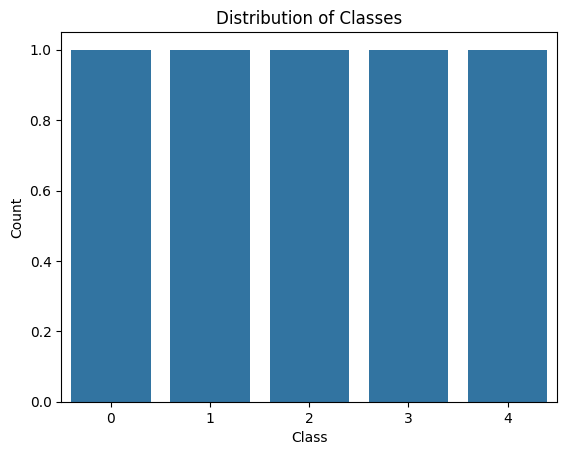

In [10]:
# Visualize the distribution of classes
def visualize_class_distribution(labels):
    sns.countplot(labels)
    plt.title('Distribution of Classes')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.show()

visualize_class_distribution([folder_map[folder] for folder in folder_map])

In [11]:
# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)

In [12]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Fit the generator
datagen.fit(X_train)


In [13]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout


In [14]:
steps_per_epoch = len(X_train) // 32
validation_steps = len(X_test) // 32

In [15]:
def build_model():
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(5, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model = build_model()

# Model summary
model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │      22,151,424 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 5)                   │           1,285 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,245,957 (84.86 MB)

 Trainable params: 22,245,957 (84.86 MB)

 Non-trainable params: 0 (0.00 B)

In [16]:
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=32),
    validation_data=(X_test, y_test),
    epochs=10,
    steps_per_epoch=steps_per_epoch
)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


91/91 ━━━━━━━━━━━━━━━━━━━━ 46s 392ms/step - accuracy: 0.5302 - loss: 1.4111 - val_accuracy: 0.6876 - val_loss: 0.9111
Epoch 2/10
 1/91 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - accuracy: 0.5938 - loss: 1.1399

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5938 - loss: 1.1399 - val_accuracy: 0.6289 - val_loss: 0.9631
Epoch 3/10
91/91 ━━━━━━━━━━━━━━━━━━━━ 29s 292ms/step - accuracy: 0.6747 - loss: 0.9328 - val_accuracy: 0.6999 - val_loss: 0.8640
Epoch 4/10
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7812 - loss: 0.8034 - val_accuracy: 0.6985 - val_loss: 0.8759
Epoch 5/10
91/91 ━━━━━━━━━━━━━━━━━━━━ 29s 292ms/step - accuracy: 0.7037 - loss: 0.8566 - val_accuracy: 0.6849 - val_loss: 0.8614
Epoch 6/10
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7188 - loss: 0.8613 - val_accuracy: 0.6849 - val_loss: 0.8570
Epoch 7/10
91/91 ━━━━━━━━━━━━━━━━━━━━ 29s 293ms/step - accuracy: 0.7162 - loss: 0.8244 - val_accuracy: 0.6835 - val_loss: 0.8542
Epoch 8/10
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8438 - loss: 0.7337 - val_accuracy: 0.6767 - val_loss: 0.8788
Epoch 9/10
91/91 ━━━━━━━━━━━━━━━━━━━━ 29s 290ms/step - accuracy: 0.7121 - loss: 0.8310 - val_accuracy: 0.6917 - val_loss

In [17]:
# Evaluate the model
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f"Test accuracy: {test_acc}")

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

# Classification report
print(classification_report(y_true_classes, y_pred_classes))

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7084 - loss: 0.8317
Test accuracy: 0.6998635530471802
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        94
           1       0.49      0.88      0.63       201
           2       0.90      0.98      0.94       342
           3       0.00      0.00      0.00        47
           4       0.00      0.00      0.00        49

    accuracy                           0.70       733
   macro avg       0.28      0.37      0.31       733
weighted avg       0.55      0.70      0.61       733



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


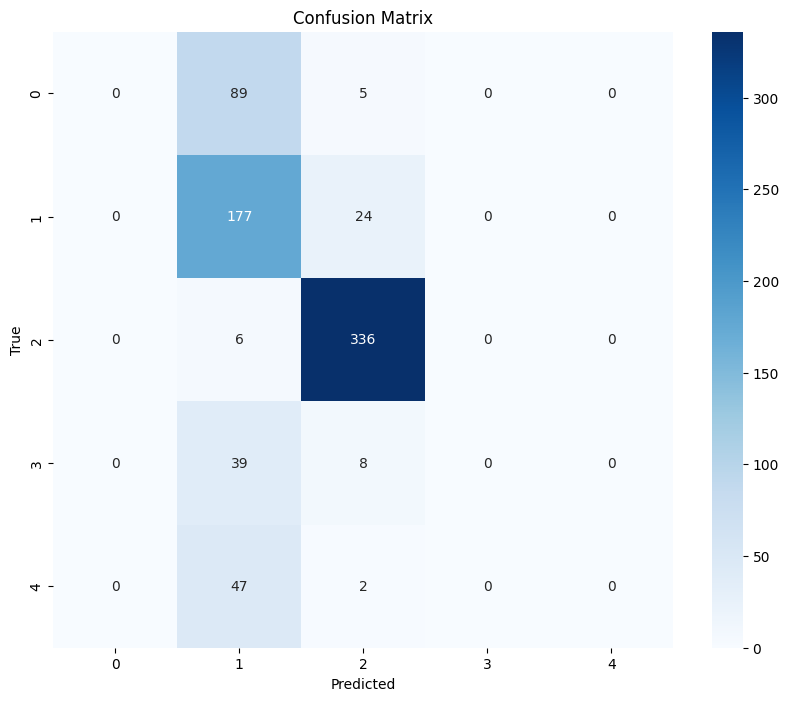

In [18]:
# Confusion matrix
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

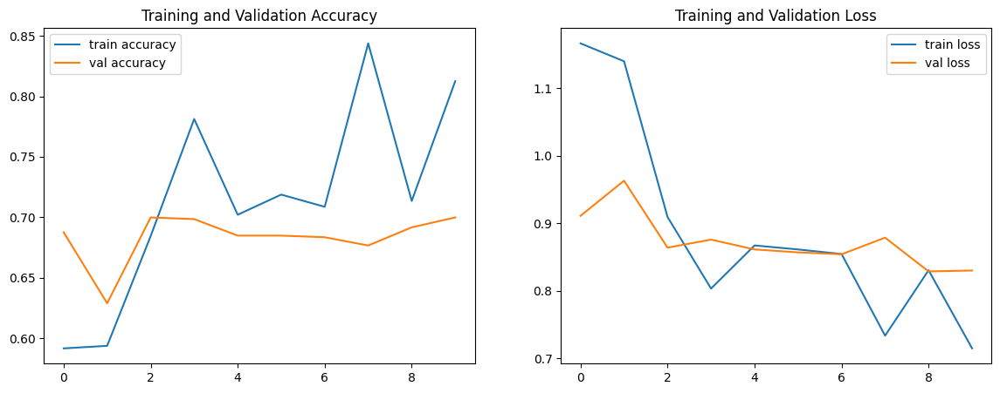

In [19]:
# Plot training & validation accuracy and loss
def plot_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    ax1.plot(history.history['accuracy'], label='train accuracy')
    ax1.plot(history.history['val_accuracy'], label='val accuracy')
    ax1.set_title('Training and Validation Accuracy')
    ax1.legend()
    ax2.plot(history.history['loss'], label='train loss')
    ax2.plot(history.history['val_loss'], label='val loss')
    ax2.set_title('Training and Validation Loss')
    ax2.legend()
    plt.show()

plot_history(history)

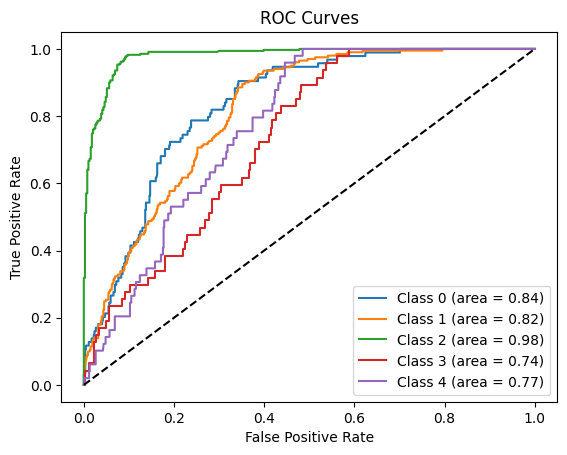

In [20]:
# Plot ROC curves
fpr = {}
tpr = {}
roc_auc = {}
for i in range(5):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure()
for i in range(5):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (area = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend(loc='lower right')
plt.show()

In [21]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model

def build_resnet50_model(input_shape=(224, 224, 3), num_classes=5):
    # Load the ResNet50 model with pretrained weights from ImageNet, excluding the top layers
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze the base model
    base_model.trainable = False

    # Add custom top layers for our specific task
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    # Create the model
    model = Model(inputs=base_model.input, outputs=predictions)

    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Build and summarize the ResNet50 model
resnet50_model = build_resnet50_model()
resnet50_model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 24,113,541 (91.99 MB)

 Trainable params: 525,829 (2.01 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [22]:
history_resnet50 = resnet50_model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=10,
    batch_size=32,
    verbose=1
)

Epoch 1/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 33s 212ms/step - accuracy: 0.4071 - loss: 1.5506 - val_accuracy: 0.4666 - val_loss: 1.3353
Epoch 2/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - accuracy: 0.4935 - loss: 1.3084 - val_accuracy: 0.4666 - val_loss: 1.3058
Epoch 3/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - accuracy: 0.4886 - loss: 1.2980 - val_accuracy: 0.4666 - val_loss: 1.3038
Epoch 4/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - accuracy: 0.4970 - loss: 1.2628 - val_accuracy: 0.4666 - val_loss: 1.2784
Epoch 5/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - accuracy: 0.5132 - loss: 1.2582 - val_accuracy: 0.4666 - val_loss: 1.2669
Epoch 6/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - accuracy: 0.4838 - loss: 1.2556 - val_accuracy: 0.4666 - val_loss: 1.2415
Epoch 7/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step - accuracy: 0.5055 - loss: 1.1982 - val_accuracy: 0.4666 - val_loss: 1.2034
Epoch 8/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - accuracy: 0.5246 - loss: 1.1555 - val_accuracy: 0.4666 -

In [23]:
# Evaluate the ResNet-50 model
test_loss_resnet50, test_acc_resnet50 = resnet50_model.evaluate(X_test, y_test)
print(f"ResNet-50 Test accuracy: {test_acc_resnet50}")

# Predict the labels for the test set
y_pred_resnet50 = resnet50_model.predict(X_test)
y_pred_classes_resnet50 = np.argmax(y_pred_resnet50, axis=1)
y_true_classes_resnet50 = np.argmax(y_test, axis=1)

# Classification report
print(classification_report(y_true_classes_resnet50, y_pred_classes_resnet50))

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - accuracy: 0.4655 - loss: 1.1714
ResNet-50 Test accuracy: 0.46793997287750244
23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 207ms/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        94
           1       1.00      0.00      0.01       201
           2       0.47      1.00      0.64       342
           3       0.00      0.00      0.00        47
           4       0.00      0.00      0.00        49

    accuracy                           0.47       733
   macro avg       0.29      0.20      0.13       733
weighted avg       0.49      0.47      0.30       733



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


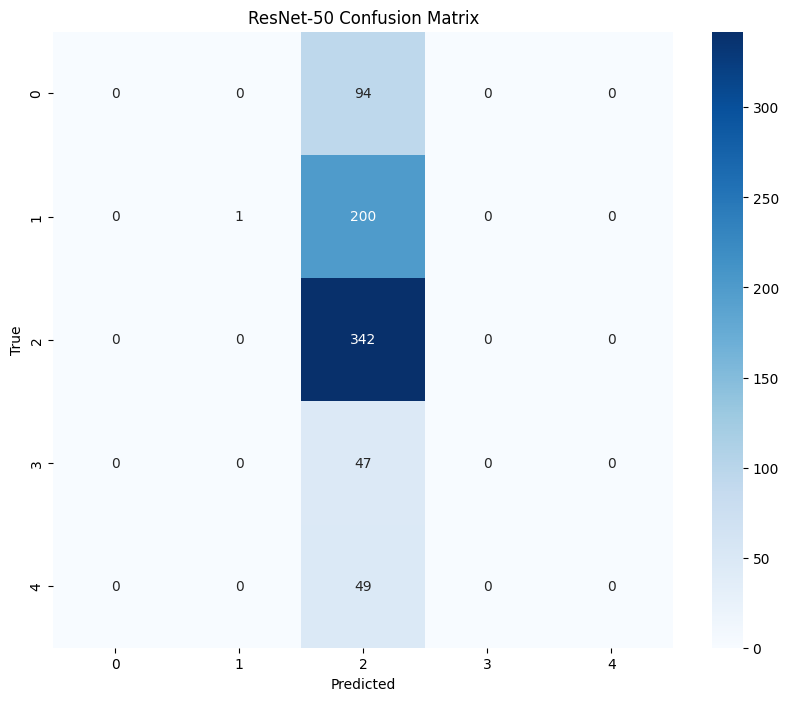

In [24]:
# Confusion matrix
conf_matrix_resnet50 = confusion_matrix(y_true_classes_resnet50, y_pred_classes_resnet50)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_resnet50, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('ResNet-50 Confusion Matrix')
plt.show()

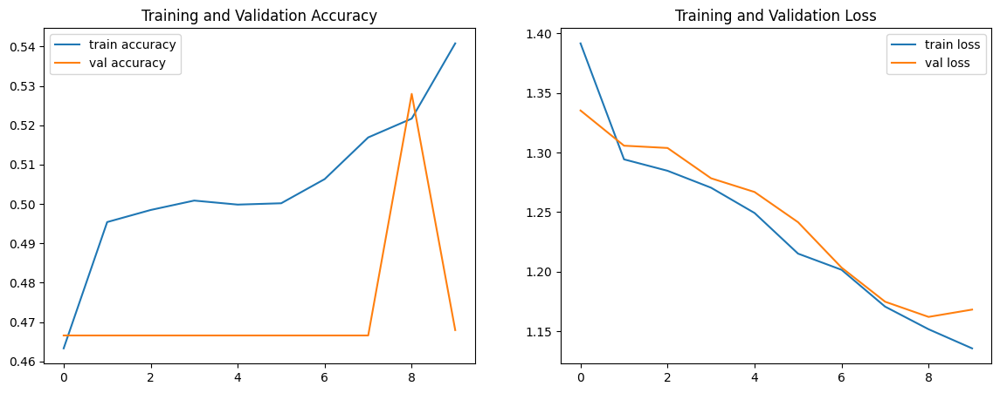

In [25]:
# Plot training & validation accuracy and loss
def plot_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    ax1.plot(history.history['accuracy'], label='train accuracy')
    ax1.plot(history.history['val_accuracy'], label='val accuracy')
    ax1.set_title('Training and Validation Accuracy')
    ax1.legend()
    ax2.plot(history.history['loss'], label='train loss')
    ax2.plot(history.history['val_loss'], label='val loss')
    ax2.set_title('Training and Validation Loss')
    ax2.legend()
    plt.show()
# Plot training & validation accuracy and loss for ResNet-50
plot_history(history_resnet50)

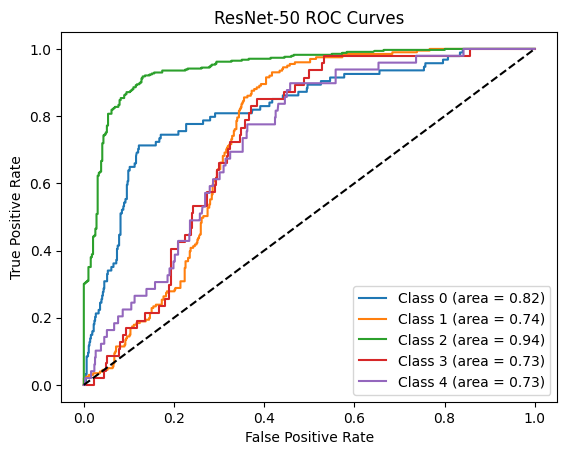

In [26]:
# Plot ROC curves for ResNet-50
fpr_resnet50 = {}
tpr_resnet50 = {}
roc_auc_resnet50 = {}
for i in range(5):
    fpr_resnet50[i], tpr_resnet50[i], _ = roc_curve(y_test[:, i], y_pred_resnet50[:, i])
    roc_auc_resnet50[i] = auc(fpr_resnet50[i], tpr_resnet50[i])

plt.figure()
for i in range(5):
    plt.plot(fpr_resnet50[i], tpr_resnet50[i], label=f'Class {i} (area = {roc_auc_resnet50[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ResNet-50 ROC Curves')
plt.legend(loc='lower right')
plt.show()

In [27]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Fit the generator
datagen.fit(X_train)

In [28]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

def build_model():
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Flatten(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(5, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model = build_model()

# Model summary
model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 256)                 │      22,151,424 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 5)                   │           1,285 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,245,957 (84.86 MB)

 Trainable params: 22,245,957 (84.86 MB)

 Non-trainable params: 0 (0.00 B)

In [29]:
# Train the model without using the generator for validation data
# Determine steps per epoch
batch_size = 32
steps_per_epoch = len(X_train) // batch_size
validation_steps = len(X_test) // batch_size
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=batch_size),
    validation_data=(X_test, y_test),
    epochs=25,
    steps_per_epoch=steps_per_epoch
)

Epoch 1/25


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


91/91 ━━━━━━━━━━━━━━━━━━━━ 36s 334ms/step - accuracy: 0.5046 - loss: 1.3769 - val_accuracy: 0.6876 - val_loss: 0.9325
Epoch 2/25
 1/91 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - accuracy: 0.7812 - loss: 0.7030

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7812 - loss: 0.7030 - val_accuracy: 0.6835 - val_loss: 0.9623
Epoch 3/25
91/91 ━━━━━━━━━━━━━━━━━━━━ 29s 293ms/step - accuracy: 0.6767 - loss: 0.9446 - val_accuracy: 0.6930 - val_loss: 0.9234
Epoch 4/25
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6875 - loss: 0.8535 - val_accuracy: 0.6930 - val_loss: 0.9395
Epoch 5/25
91/91 ━━━━━━━━━━━━━━━━━━━━ 29s 291ms/step - accuracy: 0.6989 - loss: 0.8733 - val_accuracy: 0.6739 - val_loss: 1.0082
Epoch 6/25
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7812 - loss: 0.7952 - val_accuracy: 0.6739 - val_loss: 1.0109
Epoch 7/25
91/91 ━━━━━━━━━━━━━━━━━━━━ 29s 290ms/step - accuracy: 0.7062 - loss: 0.8585 - val_accuracy: 0.6917 - val_loss: 0.8440
Epoch 8/25
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7812 - loss: 0.6338 - val_accuracy: 0.6917 - val_loss: 0.8465
Epoch 9/25
91/91 ━━━━━━━━━━━━━━━━━━━━ 29s 289ms/step - accuracy: 0.6985 - loss: 0.8527 - val_accuracy: 0.6930 - val_loss

In [30]:
# Evaluate the model
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f"Test accuracy: {test_acc}")

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7013 - loss: 0.7960
Test accuracy: 0.6916780471801758


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step


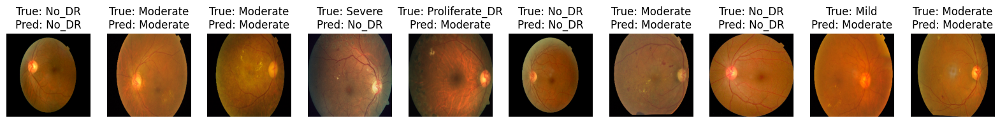

In [31]:
# Function to display predicted vs. actual labels
def display_predictions(images, true_labels, pred_labels, class_names, num_samples=10):
    fig, axes = plt.subplots(1, num_samples, figsize=(20, 4))
    indices = np.random.choice(range(len(images)), num_samples, replace=False)
    for i, idx in enumerate(indices):
        axes[i].imshow(images[idx])
        axes[i].axis('off')
        axes[i].set_title(f"True: {class_names[true_labels[idx]]}\nPred: {class_names[pred_labels[idx]]}")
    plt.show()

# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

# Display a few predictions
class_names = list(folder_map.keys())
display_predictions(X_test, y_true_classes, y_pred_classes, class_names)

In [32]:
# Classification report
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_true_classes, y_pred_classes))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        94
           1       0.49      0.85      0.62       201
           2       0.88      0.99      0.93       342
           3       0.00      0.00      0.00        47
           4       0.00      0.00      0.00        49

    accuracy                           0.69       733
   macro avg       0.27      0.37      0.31       733
weighted avg       0.54      0.69      0.60       733



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


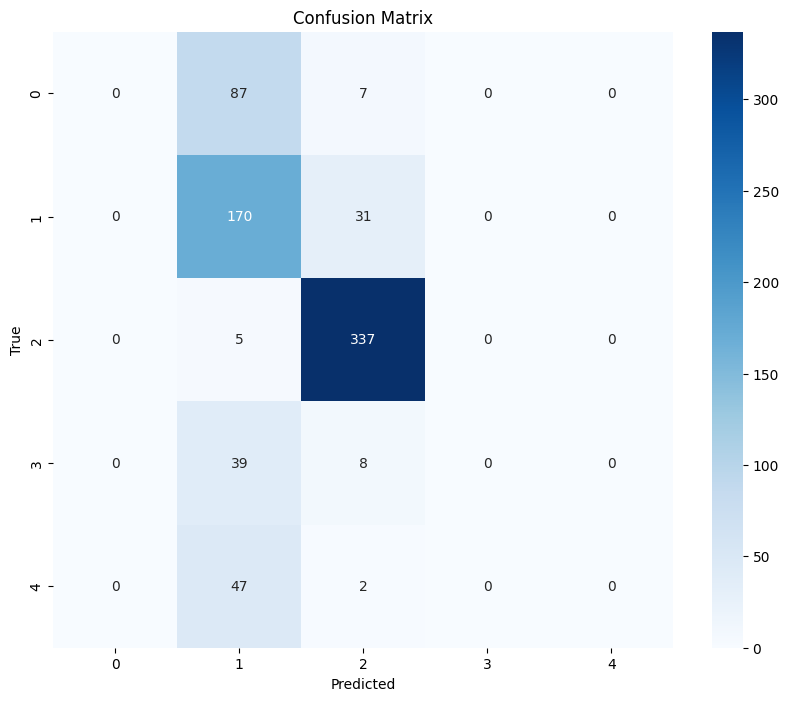

In [33]:
# Confusion matrix
import seaborn as sns
import matplotlib.pyplot as plt
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

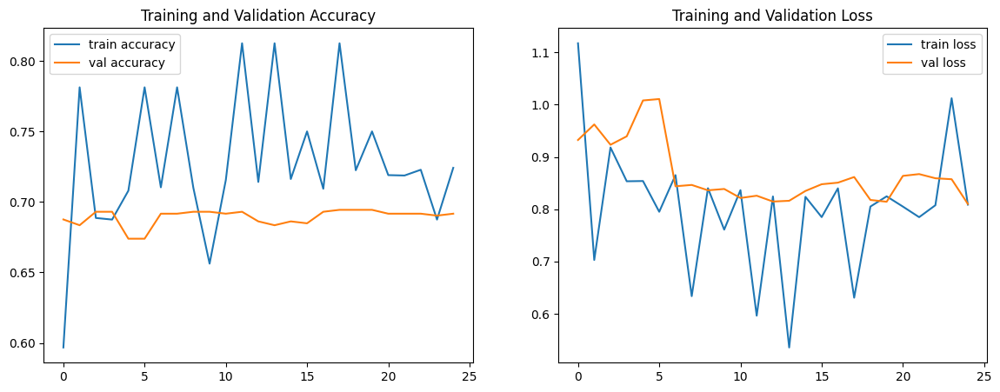

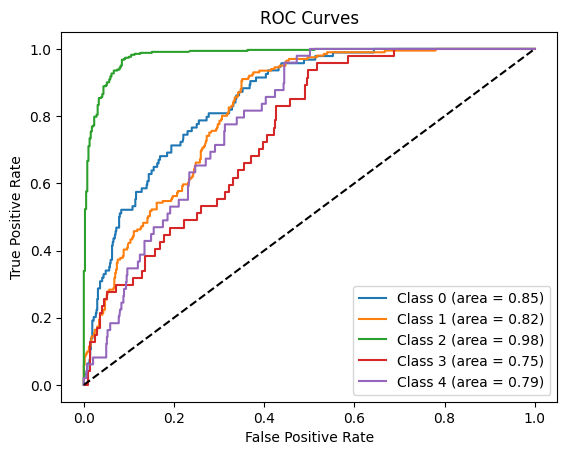

In [34]:
# Plot training & validation accuracy and loss
def plot_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    ax1.plot(history.history['accuracy'], label='train accuracy')
    ax1.plot(history.history['val_accuracy'], label='val accuracy')
    ax1.set_title('Training and Validation Accuracy')
    ax1.legend()
    ax2.plot(history.history['loss'], label='train loss')
    ax2.plot(history.history['val_loss'], label='val loss')
    ax2.set_title('Training and Validation Loss')
    ax2.legend()
    plt.show()

plot_history(history)

# Plot ROC curves
from sklearn.metrics import roc_curve, auc
fpr = {}
tpr = {}
roc_auc = {}
for i in range(5):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure()
for i in range(5):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (area = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend(loc='lower right')
plt.show()

In [35]:
# Save the model architecture to a JSON file
model_json = model.to_json()
with open("model_architecture.json", "w") as json_file:
    json_file.write(model_json)

# Save the model weights to an H5 file with the correct extension
model.save_weights("model.weights.h5")

# Optionally save the entire model
model.save("full_model.h5")

In [36]:
# Save the entire model in the native Keras format
model.save("model.keras")

# Optionally download the model file
from google.colab import files
files.download("model.keras")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [37]:
# Save the entire model
model.save("model.h5")

# Optionally download the model file
from google.colab import files
files.download("model.h5")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 256)                 │      22,151,424 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 5)                   │           1,285 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 66,737,873 (254.58 MB)

 Trainable params: 22,245,957 (84.86 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 44,491,916 (169.72 MB)

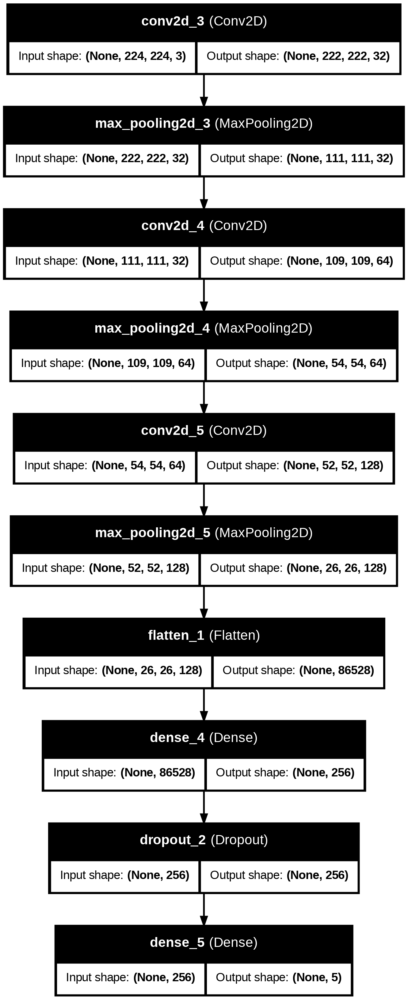

In [38]:
from tensorflow.keras.utils import plot_model

# Print the model summary
model.summary()

# Visualize the model architecture
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

# Display the model architecture image in the notebook
from IPython.display import Image
Image('model.png')

In [39]:
# Print weights for each layer
for layer in model.layers:
    weights = layer.get_weights()
    print(f"Layer: {layer.name}")
    for weight in weights:
        print(weight.shape)
        print(weight)

Layer: conv2d_3
(3, 3, 3, 32)
[[[[-1.68074712e-01  7.23536462e-02 -7.85061717e-02 -1.04772769e-01
    -8.33530053e-02 -2.06122957e-02 -4.20186296e-02  1.52356531e-02
    -1.21138550e-01  2.70536002e-02  5.43206371e-03 -1.02595948e-02
     2.06071548e-02  1.07539162e-01  1.88457388e-02  3.22222747e-02
     8.43427256e-02 -5.10023162e-02 -1.17197432e-01 -6.64444268e-02
    -1.37439966e-01 -6.93682954e-02  3.44436243e-02 -8.01530406e-02
     4.94643711e-02  9.23222378e-02 -1.86539769e-01 -5.80882691e-02
    -8.10980052e-02  7.85898939e-02 -1.02722064e-01 -7.82914236e-02]
   [-4.93871868e-02 -1.24195419e-01  2.88215093e-02 -8.55500028e-02
    -1.18418090e-01  9.25259143e-02 -3.97839583e-02 -4.01192456e-02
     2.20997408e-02 -1.12545438e-01  1.13426343e-01 -1.21209793e-01
     3.05009186e-02 -1.41734168e-01 -7.09041348e-03 -1.24721333e-01
     5.92030995e-02 -4.94901054e-02  8.11689794e-02 -2.68790890e-02
    -9.94925201e-02  1.22683570e-01 -6.90421369e-03  3.87097932e-02
    -1.39642537e-

In [40]:
for layer in model.layers:
    weights = layer.get_weights()  # This returns a list of numpy arrays
    if weights:  # Check if the layer has weights
        print(f'Layer: {layer.name}')
        for weight in weights:
            print(weight.shape)
            print(weight)

Layer: conv2d_3
(3, 3, 3, 32)
[[[[-1.68074712e-01  7.23536462e-02 -7.85061717e-02 -1.04772769e-01
    -8.33530053e-02 -2.06122957e-02 -4.20186296e-02  1.52356531e-02
    -1.21138550e-01  2.70536002e-02  5.43206371e-03 -1.02595948e-02
     2.06071548e-02  1.07539162e-01  1.88457388e-02  3.22222747e-02
     8.43427256e-02 -5.10023162e-02 -1.17197432e-01 -6.64444268e-02
    -1.37439966e-01 -6.93682954e-02  3.44436243e-02 -8.01530406e-02
     4.94643711e-02  9.23222378e-02 -1.86539769e-01 -5.80882691e-02
    -8.10980052e-02  7.85898939e-02 -1.02722064e-01 -7.82914236e-02]
   [-4.93871868e-02 -1.24195419e-01  2.88215093e-02 -8.55500028e-02
    -1.18418090e-01  9.25259143e-02 -3.97839583e-02 -4.01192456e-02
     2.20997408e-02 -1.12545438e-01  1.13426343e-01 -1.21209793e-01
     3.05009186e-02 -1.41734168e-01 -7.09041348e-03 -1.24721333e-01
     5.92030995e-02 -4.94901054e-02  8.11689794e-02 -2.68790890e-02
    -9.94925201e-02  1.22683570e-01 -6.90421369e-03  3.87097932e-02
    -1.39642537e-

In [41]:
import numpy as np

def save_layer_weights(layer, layer_name):
    weights = layer.get_weights()
    if weights:
        np.save(f'{layer_name}_weights.npy', weights[0])
        np.save(f'{layer_name}_bias.npy', weights[1])

for layer in model.layers:
    save_layer_weights(layer, layer.name)

In [42]:
def load_layer_weights(layer_name):
    weights = np.load(f'{layer_name}_weights.npy')
    bias = np.load(f'{layer_name}_bias.npy')
    return weights, bias

for layer in model.layers:
    if layer.get_weights():
        weights, bias = load_layer_weights(layer.name)
        print(f'Layer: {layer.name}')
        print('Weights:')
        print(weights)
        print('Bias:')
        print(bias)

Layer: conv2d_3
Weights:
[[[[-1.68074712e-01  7.23536462e-02 -7.85061717e-02 -1.04772769e-01
    -8.33530053e-02 -2.06122957e-02 -4.20186296e-02  1.52356531e-02
    -1.21138550e-01  2.70536002e-02  5.43206371e-03 -1.02595948e-02
     2.06071548e-02  1.07539162e-01  1.88457388e-02  3.22222747e-02
     8.43427256e-02 -5.10023162e-02 -1.17197432e-01 -6.64444268e-02
    -1.37439966e-01 -6.93682954e-02  3.44436243e-02 -8.01530406e-02
     4.94643711e-02  9.23222378e-02 -1.86539769e-01 -5.80882691e-02
    -8.10980052e-02  7.85898939e-02 -1.02722064e-01 -7.82914236e-02]
   [-4.93871868e-02 -1.24195419e-01  2.88215093e-02 -8.55500028e-02
    -1.18418090e-01  9.25259143e-02 -3.97839583e-02 -4.01192456e-02
     2.20997408e-02 -1.12545438e-01  1.13426343e-01 -1.21209793e-01
     3.05009186e-02 -1.41734168e-01 -7.09041348e-03 -1.24721333e-01
     5.92030995e-02 -4.94901054e-02  8.11689794e-02 -2.68790890e-02
    -9.94925201e-02  1.22683570e-01 -6.90421369e-03  3.87097932e-02
    -1.39642537e-01 -1

In [43]:
from tensorflow.keras.applications import VGG16, InceptionV3, ResNet50
from tensorflow.keras.layers import Input, Concatenate, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, BatchNormalization

# Import other necessary libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc


In [44]:
def build_alexnet(input_shape=(224, 224, 3)):
    model = Sequential([
        Conv2D(96, (11, 11), strides=4, padding='same', activation='relu', input_shape=input_shape),
        MaxPooling2D(pool_size=(3, 3), strides=2),
        BatchNormalization(),
        Conv2D(256, (5, 5), padding='same', activation='relu'),
        MaxPooling2D(pool_size=(3, 3), strides=2),
        BatchNormalization(),
        Conv2D(384, (3, 3), padding='same', activation='relu'),
        Conv2D(384, (3, 3), padding='same', activation='relu'),
        Conv2D(256, (3, 3), padding='same', activation='relu'),
        MaxPooling2D(pool_size=(3, 3), strides=2),
        Flatten()
    ])
    return model

alexnet_model = build_alexnet()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [45]:
def build_vgg16(input_shape=(224, 224, 3)):
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    x = base_model.output
    x = Flatten()(x)
    return Model(inputs=base_model.input, outputs=x)

vgg16_model = build_vgg16()
vgg16_model.trainable = False


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [46]:
def build_inceptionv3(input_shape=(224, 224, 3)):
    base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    return Model(inputs=base_model.input, outputs=x)

inceptionv3_model = build_inceptionv3()
inceptionv3_model.trainable = False


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [47]:
def build_resnet50(input_shape=(224, 224, 3)):
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    return Model(inputs=base_model.input, outputs=x)

resnet50_model = build_resnet50()
resnet50_model.trainable = False


In [48]:
def build_ensemble(input_shape=(224, 224, 3), num_classes=5):
    input_layer = Input(shape=input_shape)

    # Get the output from each base model
    alexnet_output = alexnet_model(input_layer)
    vgg16_output = vgg16_model(input_layer)
    inceptionv3_output = inceptionv3_model(input_layer)
    resnet50_output = resnet50_model(input_layer)

    # Concatenate outputs
    concatenated = Concatenate()([alexnet_output, vgg16_output, inceptionv3_output, resnet50_output])

    # Meta-learner
    x = Dense(256, activation='relu')(concatenated)
    x = Dropout(0.5)(x)
    output_layer = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    return model

ensemble_model = build_ensemble()
ensemble_model.summary()


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_2 (Sequential) │ (None, 9216)           │      3,748,608 │ input_layer_7[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ functional_4 (Functional) │ (None, 25088)          │     14,714,688 │ input_layer_7[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ functional_5 (Functional) │ (None, 2048)           │     21,802,784 │ input_layer_7[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ functional_6 (Functional) │ (None, 2048)           │     23,587,712 │ input_layer_7[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_2             │ (None, 38400)          │              0 │ sequential_2[0][0],    │
│ (Concatenate)             │                        │                │ functional_4[0][0],    │
│                           │                        │                │ functional_5[0][0],    │
│                           │                        │                │ functional_6[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_6 (Dense)           │ (None, 256)            │      9,830,656 │ concatenate_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 256)            │              0 │ dense_6[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_7 (Dense)           │ (None, 5)              │          1,285 │ dropout_3[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 73,685,733 (281.09 MB)

 Trainable params: 13,579,845 (51.80 MB)

 Non-trainable params: 60,105,888 (229.29 MB)

In [49]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Fit the generator
datagen.fit(X_train)

In [50]:
from sklearn.utils import class_weight

# Calculate class weights
class_weights = class_weight.compute_class_weight(
    'balanced',
    classes=np.unique(np.argmax(y_train, axis=1)),
    y=np.argmax(y_train, axis=1)
)
class_weights_dict = dict(enumerate(class_weights))

In [51]:
# Train the ensemble model with class weights
history_ensemble = ensemble_model.fit(
    datagen.flow(X_train, y_train, batch_size=32),
    validation_data=datagen.flow(X_test, y_test, batch_size=32),
    epochs=10,
    steps_per_epoch=len(X_train) // 32,
    validation_steps=len(X_test) // 32,
    class_weight=class_weights_dict,
    verbose=1
)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


91/91 ━━━━━━━━━━━━━━━━━━━━ 109s 694ms/step - accuracy: 0.3282 - loss: 5.6059 - val_accuracy: 0.5142 - val_loss: 1.1021
Epoch 2/10
 1/91 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - accuracy: 0.6250 - loss: 1.6527

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


91/91 ━━━━━━━━━━━━━━━━━━━━ 18s 201ms/step - accuracy: 0.6250 - loss: 1.6527 - val_accuracy: 0.7241 - val_loss: 0.7672
Epoch 3/10
91/91 ━━━━━━━━━━━━━━━━━━━━ 36s 374ms/step - accuracy: 0.4926 - loss: 1.4118 - val_accuracy: 0.5270 - val_loss: 1.0441
Epoch 4/10
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5312 - loss: 1.9160 - val_accuracy: 0.5517 - val_loss: 0.8934
Epoch 5/10
91/91 ━━━━━━━━━━━━━━━━━━━━ 36s 374ms/step - accuracy: 0.4988 - loss: 1.4053 - val_accuracy: 0.5185 - val_loss: 0.9915
Epoch 6/10
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4688 - loss: 1.3932 - val_accuracy: 0.5517 - val_loss: 0.9392
Epoch 7/10
91/91 ━━━━━━━━━━━━━━━━━━━━ 36s 373ms/step - accuracy: 0.4886 - loss: 1.3783 - val_accuracy: 0.5256 - val_loss: 0.9641
Epoch 8/10
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4062 - loss: 1.3845 - val_accuracy: 0.5172 - val_loss: 1.1080
Epoch 9/10
91/91 ━━━━━━━━━━━━━━━━━━━━ 36s 373ms/step - accuracy: 0.4750 - loss: 1.4221 - val_accuracy: 0.4844 - val_l

In [52]:
# Evaluate the model
test_loss_ensemble, test_acc_ensemble = ensemble_model.evaluate(X_test, y_test)
print(f"Ensemble Model Test accuracy: {test_acc_ensemble}")

23/23 ━━━━━━━━━━━━━━━━━━━━ 17s 334ms/step - accuracy: 0.5050 - loss: 0.9569
Ensemble Model Test accuracy: 0.5225102305412292


23/23 ━━━━━━━━━━━━━━━━━━━━ 20s 516ms/step


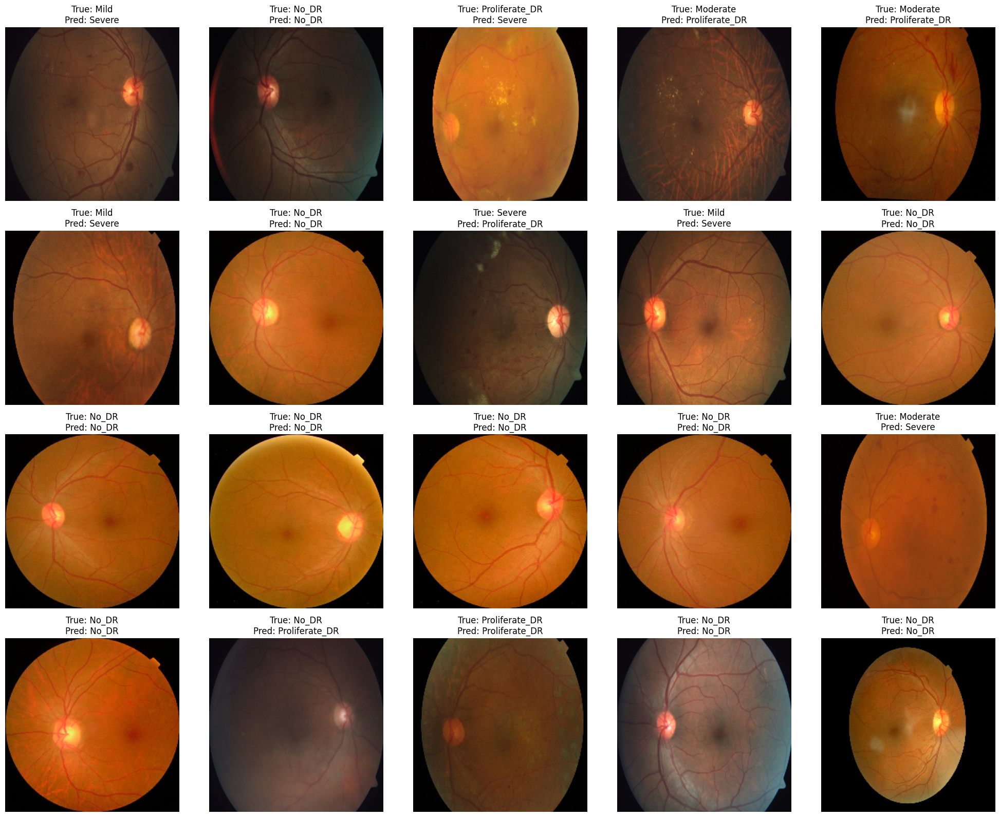

In [53]:
# Function to display predicted vs. actual labels
def display_predictions(images, true_labels, pred_labels, class_names, num_samples=20):
    fig, axes = plt.subplots(4, 5, figsize=(20, 16))  # 4 rows and 5 columns
    indices = np.random.choice(range(len(images)), num_samples, replace=False)
    for i, idx in enumerate(indices):
        ax = axes[i // 5, i % 5]  # Calculate row and column index
        ax.imshow(images[idx])
        ax.axis('off')
        ax.set_title(f"True: {class_names[true_labels[idx]]}\nPred: {class_names[pred_labels[idx]]}")
    plt.tight_layout()
    plt.show()


# Predict the labels for the test set
y_pred = ensemble_model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

# Display a few predictions
class_names = list(folder_map.keys())
display_predictions(X_test, y_true_classes, y_pred_classes, class_names, num_samples=20)

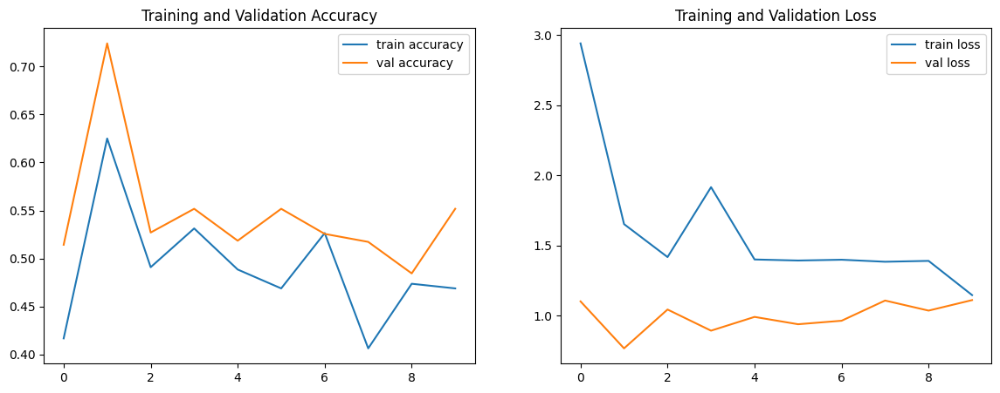

In [54]:
# Plot training & validation accuracy and loss
# Plot training & validation accuracy and loss
def plot_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    ax1.plot(history.history['accuracy'], label='train accuracy')
    ax1.plot(history.history['val_accuracy'], label='val accuracy')
    ax1.set_title('Training and Validation Accuracy')
    ax1.legend()
    ax2.plot(history.history['loss'], label='train loss')
    ax2.plot(history.history['val_loss'], label='val loss')
    ax2.set_title('Training and Validation Loss')
    ax2.legend()
    plt.show()
plot_history(history_ensemble)

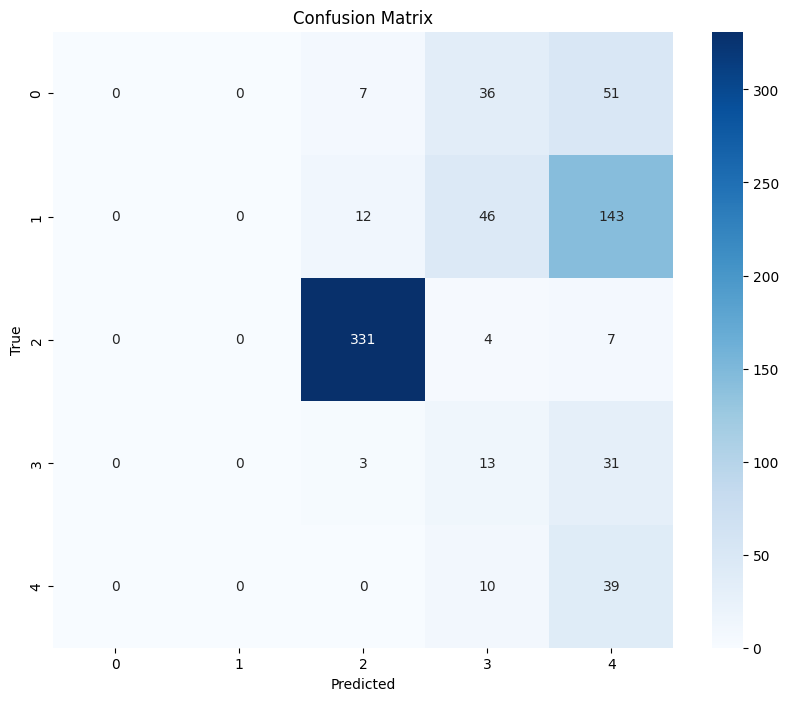

In [55]:
# Confusion matrix
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

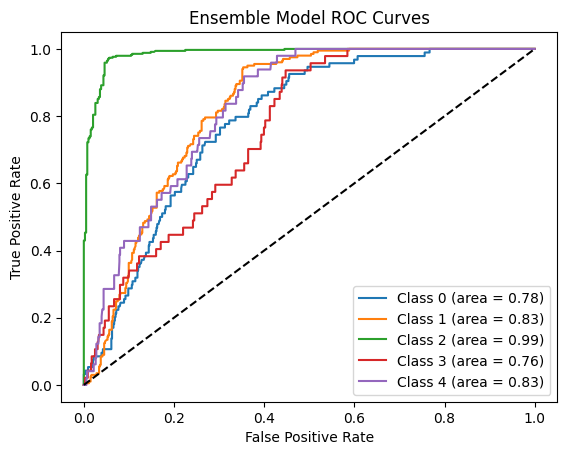

In [56]:
# Plot ROC curves
fpr = {}
tpr = {}
roc_auc = {}
for i in range(5):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure()
for i in range(5):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (area = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Ensemble Model ROC Curves')
plt.legend(loc='lower right')
plt.show()

In [81]:
# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Fit the generator
datagen.fit(X_train)

In [82]:
def lr_rate(epoch, lr):
    if epoch < 10:
        lr = 0.0001
        return lr
    elif epoch <= 15:
        lr = 0.0005
        return lr
    elif epoch <= 30:
        lr = 0.0001
        return lr
    else:
        lr = lr * (epoch / (1 + epoch))
        return lr

lr_callback = tf.keras.callbacks.LearningRateScheduler(lr_rate)

In [88]:
# Define the EfficientNetB0 model with explicit input layer
#!pip install -q efficientnet
import efficientnet.tfkeras as efn
# Define input shape and number of classes
input_shape = (224, 224, 3)
num_classes = 5

# Create the base model with EfficientNetB0
base_model = efn.EfficientNetB0(
    input_shape=input_shape,
    weights='imagenet',
    include_top=False
)

In [89]:
# Create the model
inputs = Input(shape=input_shape)
x = base_model(inputs, training=False)
x = GlobalAveragePooling2D()(x)
outputs = Dense(num_classes, activation='softmax')(x)

# Define the complete model
model = Model(inputs, outputs)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_17 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnet-b0 (Functional)         │ (None, 7, 7, 1280)          │       4,049,564 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_7           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_16 (Dense)                     │ (None, 5)                   │           6,405 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,055,969 (15.47 MB)

 Trainable params: 4,013,953 (15.31 MB)

 Non-trainable params: 42,016 (164.12 KB)

In [98]:
# Train the model
history = model.fit(
    datagen.flow(X_train, y_train, batch_size=32),
    validation_data=datagen.flow(X_test, y_test, batch_size=32),
    epochs=50,
    callbacks=[lr_callback],
    steps_per_epoch=len(X_train) // 32,
    validation_steps=len(X_test) // 32,
    verbose=1
)

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


91/91 ━━━━━━━━━━━━━━━━━━━━ 36s 375ms/step - accuracy: 0.8748 - loss: 0.3723 - val_accuracy: 0.8224 - val_loss: 0.4780 - learning_rate: 1.0000e-04
Epoch 2/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7188 - loss: 0.5558 - val_accuracy: 0.8621 - val_loss: 0.3270 - learning_rate: 1.0000e-04


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


Epoch 3/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 36s 369ms/step - accuracy: 0.8710 - loss: 0.3473 - val_accuracy: 0.8082 - val_loss: 0.4970 - learning_rate: 1.0000e-04
Epoch 4/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8125 - loss: 0.4451 - val_accuracy: 0.8276 - val_loss: 0.4472 - learning_rate: 1.0000e-04
Epoch 5/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 36s 367ms/step - accuracy: 0.8871 - loss: 0.3122 - val_accuracy: 0.8295 - val_loss: 0.4907 - learning_rate: 1.0000e-04
Epoch 6/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9688 - loss: 0.1740 - val_accuracy: 0.8621 - val_loss: 0.4640 - learning_rate: 1.0000e-04
Epoch 7/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 35s 366ms/step - accuracy: 0.9021 - loss: 0.2702 - val_accuracy: 0.8224 - val_loss: 0.5183 - learning_rate: 1.0000e-04
Epoch 8/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9062 - loss: 0.1688 - val_accuracy: 0.8276 - val_loss: 0.4782 - learning_rate: 1.0000e-04
Epoch 9/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 36s 369ms/step - accuracy: 0.

In [99]:
# Evaluate the model
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f"Validation accuracy: {test_acc}")

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.8377 - loss: 0.6672
Validation accuracy: 0.8294679522514343


In [100]:
# Predict the labels for the test set
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

# Display a few predictions
class_names = list(folder_map.keys())

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


In [101]:
# Function to display predicted vs. actual labels
def display_predictions(images, true_labels, pred_labels, class_names, num_samples=20):
    fig, axes = plt.subplots(4, 5, figsize=(20, 16))  # 4 rows and 5 columns
    indices = np.random.choice(range(len(images)), num_samples, replace=False)
    for i, idx in enumerate(indices):
        ax = axes[i // 5, i % 5]  # Calculate row and column index
        ax.imshow(images[idx])
        ax.axis('off')
        ax.set_title(f"True: {class_names[true_labels[idx]]}\nPred: {class_names[pred_labels[idx]]}")
    plt.tight_layout()
    plt.show()

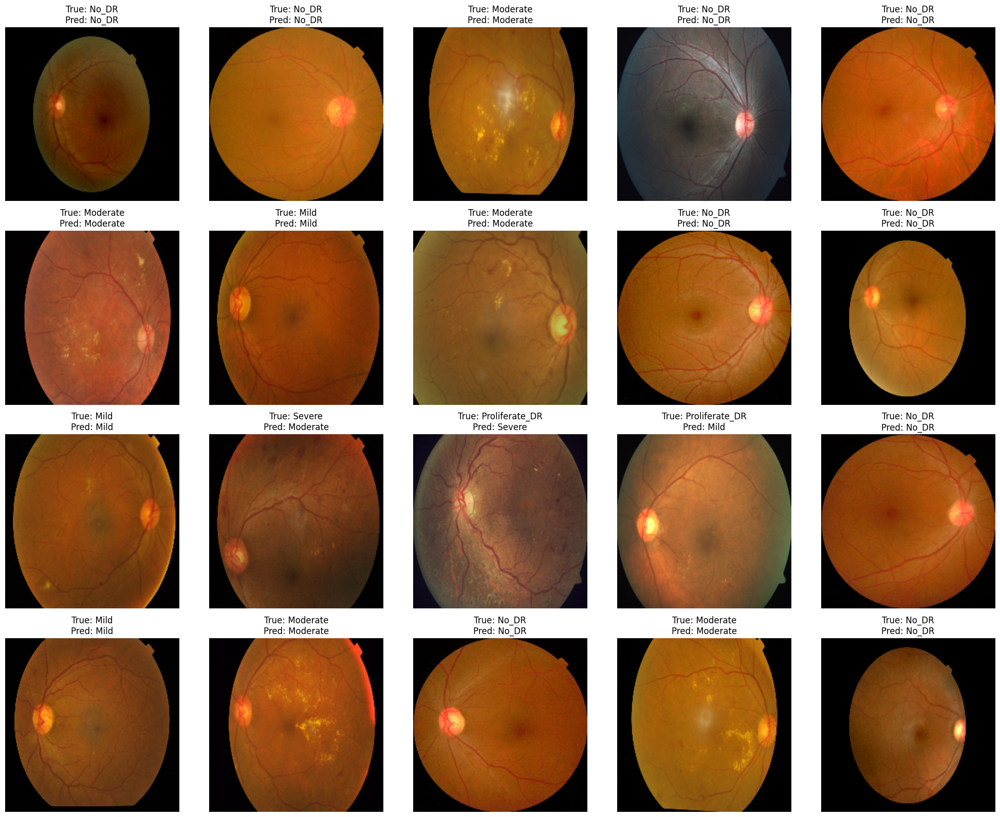

In [102]:
# Display predictions
display_predictions(X_test, y_true_classes, y_pred_classes, class_names, num_samples=20)

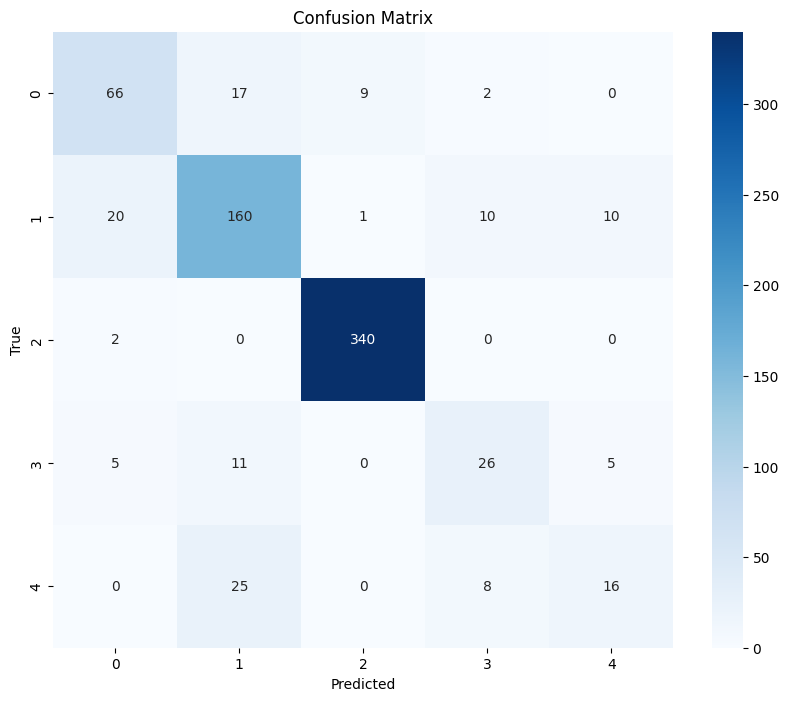

In [103]:
# Confusion matrix
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

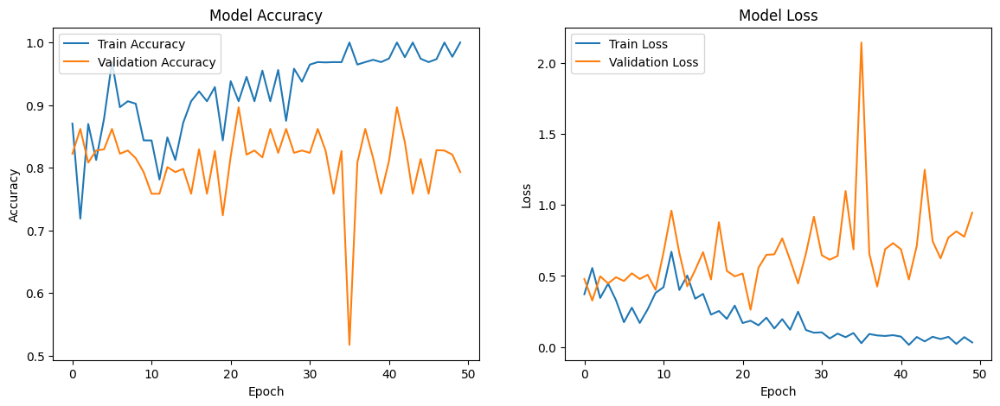

In [104]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper left')

plt.show()

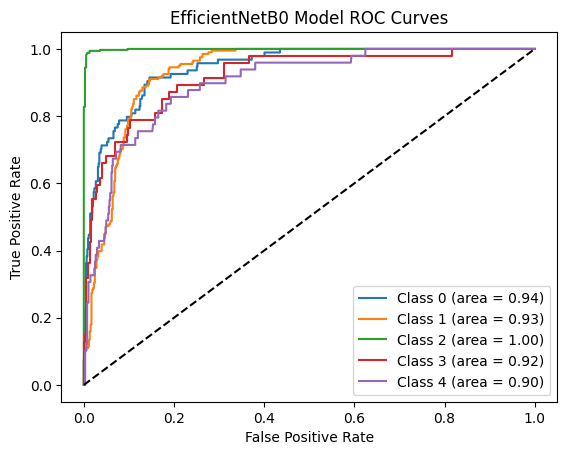

In [105]:
# Plot ROC curves
fpr = {}
tpr = {}
roc_auc = {}
for i in range(5):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure()
for i in range(5):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (area = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('EfficientNetB0 Model ROC Curves')
plt.legend(loc='lower right')
plt.show()

In [107]:
# Save model weights
model.save_weights('efficientnetb0.weights.h5')

In [108]:
from google.colab import files
files.download('efficientnetb0.weights.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [109]:
# Save the entire model
model.save('efficientnetb0_model.h5')

# Download the model file
from google.colab import files
files.download('efficientnetb0_model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [111]:
# Print model summary to get an overview of the layers
model.summary()

# Print layer names and shapes of their weights
for layer in model.layers:
    weights = layer.get_weights()
    print(f"Layer: {layer.name}")
    for weight in weights:
        print(f" - Weight shape: {weight.shape}")

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_17 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnet-b0 (Functional)         │ (None, 7, 7, 1280)          │       4,049,564 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_7           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_16 (Dense)                     │ (None, 5)                   │           6,405 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,083,877 (46.10 MB)

 Trainable params: 4,013,953 (15.31 MB)

 Non-trainable params: 42,016 (164.12 KB)

 Optimizer params: 8,027,908 (30.62 MB)

Layer: input_layer_17
Layer: efficientnet-b0
 - Weight shape: (3, 3, 3, 32)
 - Weight shape: (32,)
 - Weight shape: (32,)
 - Weight shape: (32,)
 - Weight shape: (32,)
 - Weight shape: (3, 3, 32, 1)
 - Weight shape: (32,)
 - Weight shape: (32,)
 - Weight shape: (32,)
 - Weight shape: (32,)
 - Weight shape: (1, 1, 32, 8)
 - Weight shape: (8,)
 - Weight shape: (1, 1, 8, 32)
 - Weight shape: (32,)
 - Weight shape: (1, 1, 32, 16)
 - Weight shape: (16,)
 - Weight shape: (16,)
 - Weight shape: (16,)
 - Weight shape: (16,)
 - Weight shape: (1, 1, 16, 96)
 - Weight shape: (96,)
 - Weight shape: (96,)
 - Weight shape: (96,)
 - Weight shape: (96,)
 - Weight shape: (3, 3, 96, 1)
 - Weight shape: (96,)
 - Weight shape: (96,)
 - Weight shape: (96,)
 - Weight shape: (96,)
 - Weight shape: (1, 1, 96, 4)
 - Weight shape: (4,)
 - Weight shape: (1, 1, 4, 96)
 - Weight shape: (96,)
 - Weight shape: (1, 1, 96, 24)
 - Weight shape: (24,)
 - Weight shape: (24,)
 - Weight shape: (24,)
 - Weight shape: (24,)
